# this notebook performs batch effect correction on the combined samples

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import harmonypy as ho
import sys

In [70]:
sys.path.append( "/home/lucy/")
sys.path.append( "/home/lucy/star_proto_filter/")

In [3]:
import zc_function as zc

In [71]:
import zc_filter_function as zc_filter

In [4]:
sc.set_figure_params( figsize=[4,4] )

## load data

In [92]:
dat = sc.read("./new_sample_10868_filtered/subsampled_combine_WT_Mut.h5ad")

In [93]:
dat

AnnData object with n_obs × n_vars = 9010 × 23312
    obs: 'sample', 'cell_type', 'cytotrace', 'leiden', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'condition_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [94]:
dat.raw = dat.copy()

In [95]:
zc.normalization( dat)

AnnData object with n_obs × n_vars = 9010 × 23312
    obs: 'sample', 'cell_type', 'cytotrace', 'leiden', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'condition_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [7]:
dat.obsm['X_umap_original'] = dat.obsm['X_umap'].copy()

## harmony together

In [27]:
dat

AnnData object with n_obs × n_vars = 12854 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [28]:
sc.external.pp.harmony_integrate(dat, 'sample')

2024-04-05 14:58:17,957 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f38401e2af0>
Traceback (most recent call last):
  File "/home/lucy/anaconda3/envs/qc_pipe/lib/python3.8/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/lucy/anaconda3/envs/qc_pipe/lib/python3.8/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/lucy/anaconda3/envs/qc_pipe/lib/python3.8/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/lucy/anaconda3/envs/qc_pipe/lib/python3.8/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attrib

In [26]:
n_neighbors = int( np.sqrt(dat.n_obs) )
sc.pp.neighbors( dat, n_neighbors= n_neighbors , n_pcs=50, use_rep='X_pca_harmony')

ValueError: Did not find X_pca_harmony in `.obsm.keys()`. You need to compute it first.

In [29]:
sc.tl.umap(dat, )

In [145]:
sc.set_figure_params( figsize= [4,4] )

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


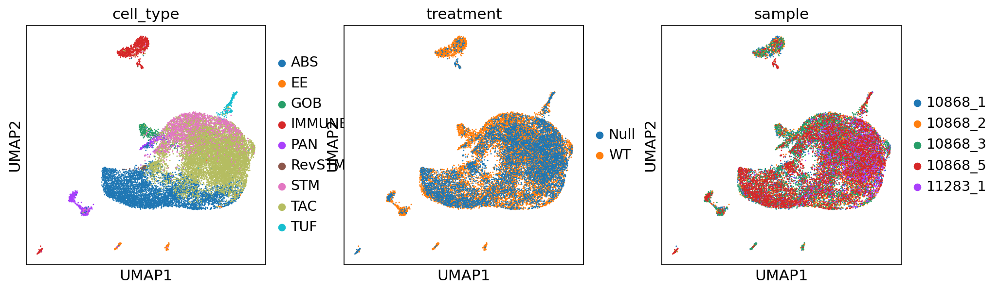

In [31]:
sc.pl.umap( dat, color = ['cell_type', 'treatment', 'sample' ] )

## plot separately

In [105]:
dat = sc.read("new_sample_10868_filtered/subsampled_epi_12356.h5ad")

In [106]:
dat.X.sum(axis = 1)

matrix([[5033.],
        [6964.],
        [4822.],
        ...,
        [ 887.],
        [ 882.],
        [ 880.]], dtype=float32)

In [107]:
dat.raw = dat.copy()

In [108]:
#dat.X.sum(axis = 1)

In [109]:
wt = dat[dat.obs['treatment'] == 'WT' ] 
mut = dat[dat.obs['treatment'] == 'Null' ] 

In [110]:
wt.raw = wt.copy()
mut.raw = mut.copy()

In [111]:
wt

AnnData object with n_obs × n_vars = 6427 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [112]:
mut

AnnData object with n_obs × n_vars = 6427 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [14]:

# dats = [wt]
# for d in dats:
#     print( 'normalizing data')
#     zc.normalization( d)
#     n_neighbors = int( np.sqrt(d) )
#     print( 'Getting PCA')
#     sc.tl.pca(d, return_info=False , use_highly_variable = False)
    
#     print( 'Starting Harmony')
#     sc.external.pp.harmony_integrate(d, 'sample')
    
#     print( 'Dimentional Reduction')
#     sc.pp.neighbors( d, n_neighbors= n_neighbors , n_pcs=50, use_rep='X_pca_harmony')
#     sc.tl.umap(d, )
#     #sc.pl.umap( d, color = ['cell_type', 'treatment', 'sample' ] )

In [12]:
def harmony_correct_umap( dat, batch_col_name,  normalized = False, robust = False,):
    if( not normalized):
        if( robust):
            print( 'normalizing data')
        ret = zc.normalization( dat)
        
    #get number of neighbours
    n_neighbors = int( np.sqrt(dat.n_obs) )
    
    if( robust):
        print( 'Getting PCA')
    sc.tl.pca(dat, return_info=False , use_highly_variable = False)
    
    if( robust):
        print( 'Starting Harmony')
    sc.external.pp.harmony_integrate(dat, batch_col_name)
    
    if( robust):
        print( 'Dimentional Reduction')
    sc.pp.neighbors( dat, n_neighbors= n_neighbors , n_pcs=50, use_rep='X_pca_harmony')
    sc.tl.umap(dat, )
    

In [13]:
wt.X.sum(axis = 1)

matrix([[5033.],
        [6964.],
        [4822.],
        ...,
        [3175.],
        [3316.],
        [9408.]], dtype=float32)

In [14]:
harmony_correct_umap( wt, 'sample',  normalized = False, robust = True,)

normalizing data
Getting PCA


2024-04-02 14:32:56,310 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Starting Harmony


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f91ec0748b0>
Traceback (most recent call last):
  File "/home/lucy/anaconda3/envs/qc_pipe/lib/python3.8/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/lucy/anaconda3/envs/qc_pipe/lib/python3.8/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/lucy/anaconda3/envs/qc_pipe/lib/python3.8/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/lucy/anaconda3/envs/qc_pipe/lib/python3.8/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._fi

Dimentional Reduction


/home/lucy/.local/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
OMP: Info #274: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


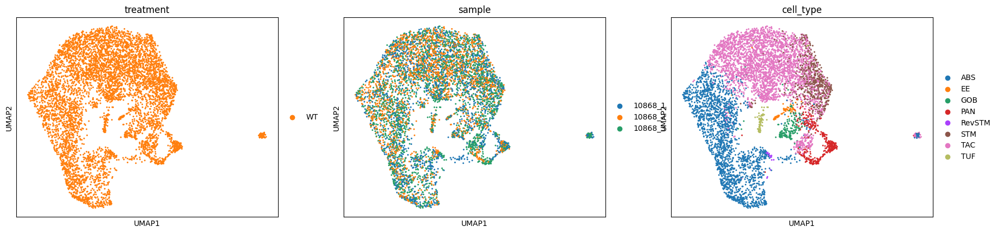

In [15]:
sc.pl.umap( wt, color = ['treatment', 'sample', 'cell_type' ] )

harmonize mutant samples

In [119]:
mut_hm_pca = pd.read_csv("./batch_effect_correction/mut_hm_pca.csv", header = None, index_col= None )

In [120]:
mut.obsm['X_pca_harmony'] = mut_hm_pca.values

In [121]:
#harmony_correct_umap( mut, 'sample',  normalized = False, robust = True,)

In [122]:
mut

AnnData object with n_obs × n_vars = 6427 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'X_pca_harmony'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [57]:
mut.raw = mut.copy()

In [58]:
mut.X = mut.layers['full_norm']

In [123]:
n_neighbors = int( np.sqrt( mut.n_obs) )
sc.pp.neighbors( mut, n_neighbors= n_neighbors , n_pcs=20, use_rep='X_pca_harmony')
sc.tl.umap(mut,random_state= 100, spread= 1.5)

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


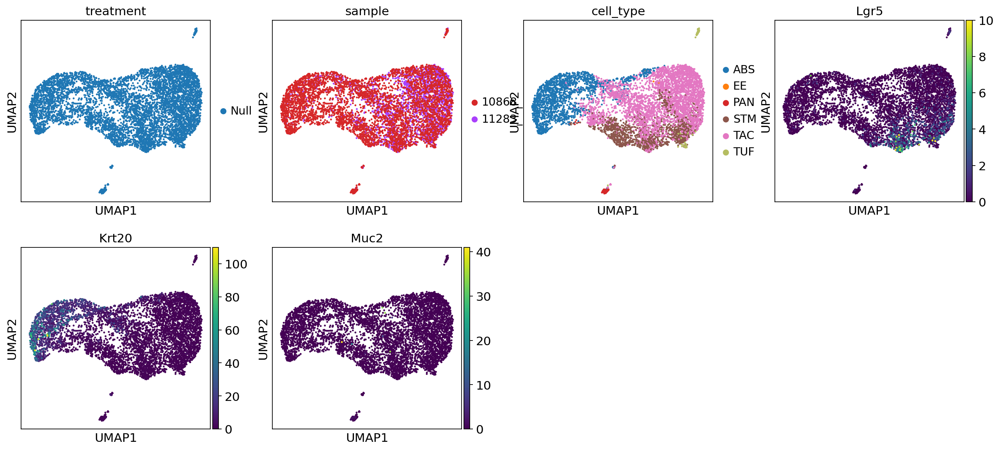

In [124]:
sc.pl.umap( mut, color = ['treatment', 'sample', 'cell_type', 'Lgr5', 'Krt20' , 'Muc2'], use_raw = False )

In [64]:
mut

AnnData object with n_obs × n_vars = 6427 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'X_pca_harmony'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

try tsne on my own

In [73]:
sc.tl.tsne( mut, use_rep='X_pca_harmony',n_pcs = 25, )

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f380d6e3d30>
Traceback (most recent call last):
  File "/home/lucy/anaconda3/envs/qc_pipe/lib/python3.8/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/lucy/anaconda3/envs/qc_pipe/lib/python3.8/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/lucy/anaconda3/envs/qc_pipe/lib/python3.8/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/lucy/anaconda3/envs/qc_pipe/lib/python3.8/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'


/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


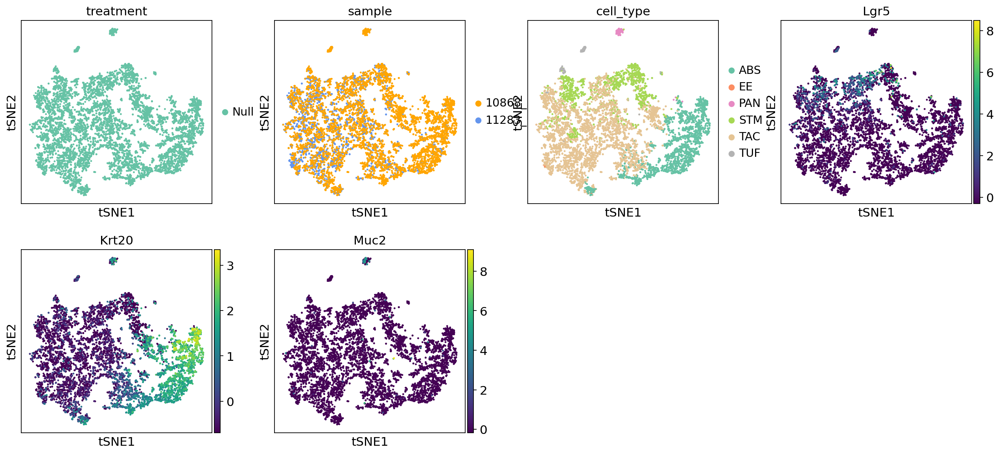

(None,)

In [87]:
sc.pl.tsne( mut, color = ['treatment', 'sample', 'cell_type', 'Lgr5', 'Krt20' , 'Muc2'], use_raw = False ) #palette = 'Set2')

In [82]:
mut

AnnData object with n_obs × n_vars = 6427 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap', 'tsne'
    obsm: 'X_pca', 'X_umap', 'X_pca_harmony', 'X_tsne'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [86]:
mut.uns['sample_colors'] = ['orange', 'cornflowerblue']

## adjust umap
- decided not the perform batch effect correction but just plot them on different UMAPs

In [26]:
dat = sc.read("./new_sample_10868_filtered/subsampled_epi_12356.h5ad")

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


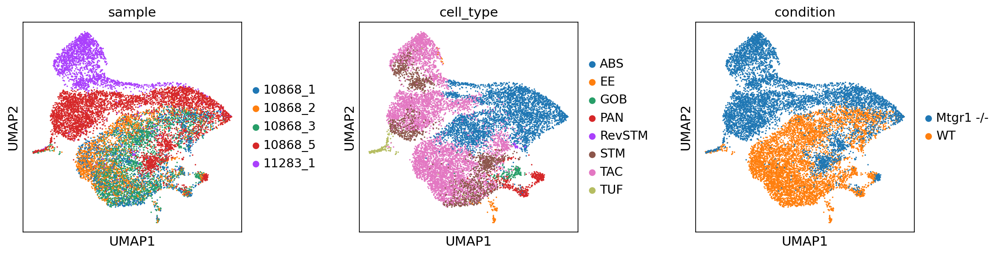

In [27]:
sc.pl.umap( dat, color = ['sample', 'cell_type',  'condition'], wspace = 0.4)

In [28]:
dat

AnnData object with n_obs × n_vars = 12854 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap', 'condition_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [98]:
wt = dat[dat.obs['condition'] == 'WT' ] 
mut = dat[dat.obs['condition'] == 'Mtgr1 -/-' ] 

In [30]:
wt_pca = pd.read_csv("./batch_effect_correction/wt_hm_pca.csv", header = None ,index_col = None )

In [32]:
mut

View of AnnData object with n_obs × n_vars = 6427 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap', 'condition_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [39]:
wt

AnnData object with n_obs × n_vars = 6427 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap', 'condition_colors'
    obsm: 'X_pca', 'X_umap', 'X_pca_hm'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [33]:
wt_pca.head()

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
0,-11.220166,-0.936621,-5.498222,4.903448,-3.026945,0.610910,-0.593877,0.212095,-0.214618,10.080432,...,-2.751698,-0.491297,1.554013,1.583562,-2.006617,0.528238,2.343197,1.667002,1.025209,-1.052883
1,-12.127165,-21.178307,13.134921,2.874443,3.831460,-0.647972,0.061352,-1.539419,-0.361050,0.415829,...,-1.244206,-0.220308,1.050894,-1.103110,-0.838887,0.082789,-0.427165,-0.012067,-0.899878,-0.187518
2,-6.964973,-11.823732,2.853687,2.934712,1.682896,-2.220447,5.682078,-0.942745,-0.240418,-1.724977,...,-0.795384,0.389846,1.019909,-0.913301,-0.691322,-0.951676,1.382248,0.040796,0.453291,0.570532
3,-13.359465,-22.663580,10.969286,6.255142,4.176807,-0.315348,-2.318411,-1.800807,0.485852,5.190105,...,-0.751871,-0.637097,-0.796755,-0.190688,0.863550,-0.770539,-0.059264,0.045720,0.734488,0.546272
4,31.967630,10.077146,8.400959,-4.232202,-5.446145,-0.651398,-2.549714,0.159641,-1.481938,4.236096,...,0.522265,-2.552897,-2.003376,-3.276786,5.042892,6.411571,0.544705,-1.196986,-1.669533,1.685994


In [36]:
#np.array( wt_pca )
wt.obsm['X_pca_hm'] =np.array( wt_pca )

In [35]:
wt_pca.shape

(6427, 50)

In [34]:
wt.obsm['X_pca'].shape

(6427, 50)

In [38]:
sc.pp.neighbors( wt, n_neighbors= int( np.sqrt( wt.n_obs) ) , n_pcs=50, use_rep='X_pca_hm')

/home/lucy/.local/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
sc.tl.umap( wt, 

## TSNE with coordinates from Ken

In [5]:
dat = sc.read("new_sample_10868_filtered/subsampled_epi_12356.h5ad")

In [6]:
dat.X.sum(axis = 1)

matrix([[5033.],
        [6964.],
        [4822.],
        ...,
        [ 887.],
        [ 882.],
        [ 880.]], dtype=float32)

In [7]:
dat.raw = dat.copy()

In [8]:
#dat.X.sum(axis = 1)

In [45]:
wt = dat[dat.obs['treatment'] == 'WT' ] 
mut = dat[dat.obs['treatment'] == 'Null' ] 

In [46]:
wt.raw = wt.copy()
mut.raw = mut.copy()

In [47]:
wt_tsne = pd.read_csv("./ken_tsne_2/wt_tsne5.csv", header = None, index_col = None)
wt_tsne.head(2)

,0,1
0,6.0633,-1.2054
1,27.5590,-48.0250


In [48]:
wt.obsm['X_umap'] = wt_tsne.values

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


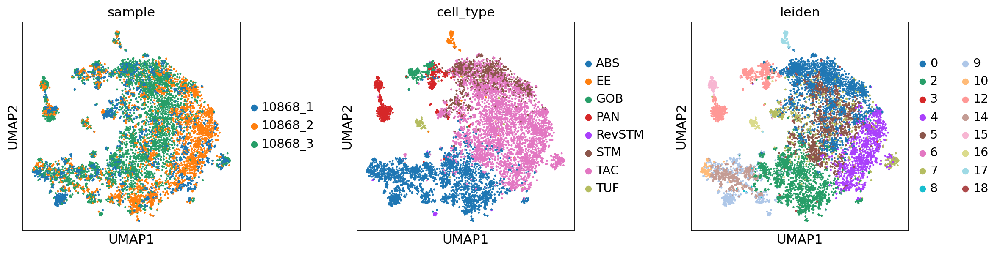

In [49]:
sc.pl.umap( wt, color = ['sample', 'cell_type', 'leiden'], wspace = 0.4)

In [50]:
wt

AnnData object with n_obs × n_vars = 6427 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

### re-annotate the secretory progenitor cluster

In [51]:
wt.X.sum(axis = 1)

matrix([[5033.],
        [6964.],
        [4822.],
        ...,
        [3175.],
        [3316.],
        [9408.]], dtype=float32)

In [52]:
wt.raw = wt.copy()

In [53]:
zc.normalization( wt)

AnnData object with n_obs × n_vars = 6427 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [54]:
sc.tl.leiden( wt, resolution=1.2)

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


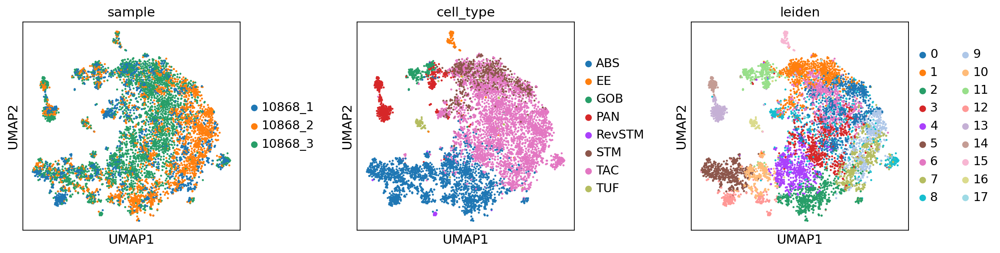

In [55]:
sc.pl.umap( wt, color = ['sample', 'cell_type', 'leiden'], wspace = 0.4)

In [56]:
cell_type2 = []
for i in range( wt.n_obs):
    curr_ct = wt.obs['cell_type'].iloc[i]
    lei = wt.obs['leiden'].iloc[i]
    if( lei == '11' and curr_ct == 'PAN' ):
        cell_type2.append( 'GOB')
    else:
        cell_type2.append( curr_ct )

In [57]:
wt.obs['cell_type_old'] = wt.obs['cell_type'].copy()

In [58]:
wt.obs['cell_type'] = cell_type2

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


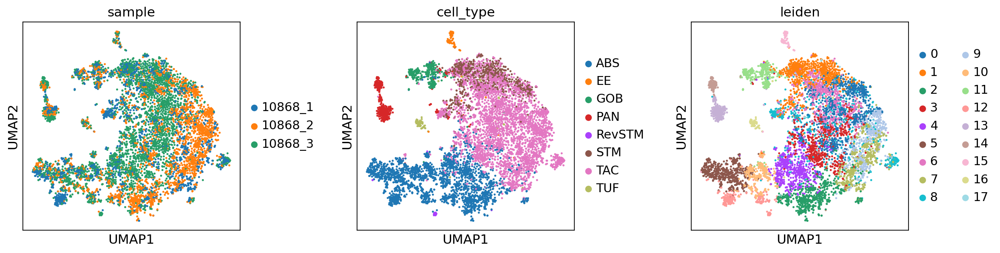

In [59]:
sc.pl.umap( wt, color = ['sample', 'cell_type', 'leiden'], wspace = 0.4)

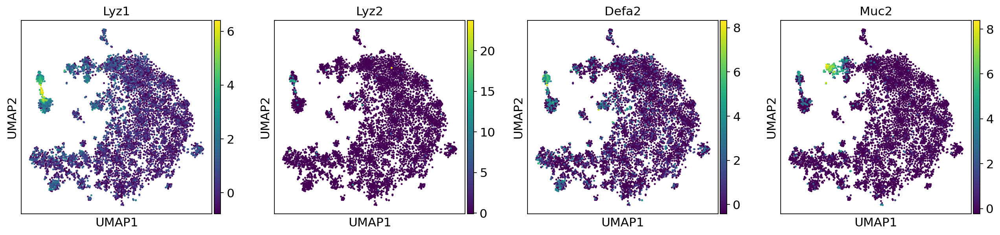

In [37]:
sc.pl.umap( wt, color = ['Lyz1','Lyz2','Defa2', 'Muc2',], use_raw = False )

### re-annotate paneth cell population

In [77]:
cell_type3 = []
for i in range( wt.n_obs):
    curr_ct = wt.obs['cell_type'].iloc[i]
    lei = wt.obs['leiden'].iloc[i]
    if( lei == '8' and curr_ct == 'TAC' ):
        cell_type3.append( 'PAN')
    else:
        cell_type3.append( curr_ct )

In [78]:
wt.obs['cell_type'] = cell_type3

### mutant tnsne

In [15]:
mt_tsne = pd.read_csv("./ken_tsne_2/mut_tsne2.csv", header = None, index_col= None)

In [16]:
mt_tsne.shape

(6427, 2)

In [18]:
mut

AnnData object with n_obs × n_vars = 6427 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [20]:
mut.obsm['X_umap'] = mt_tsne.values

In [21]:
mut.raw = mut.copy()

In [22]:
zc.normalization( mut)

AnnData object with n_obs × n_vars = 6427 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


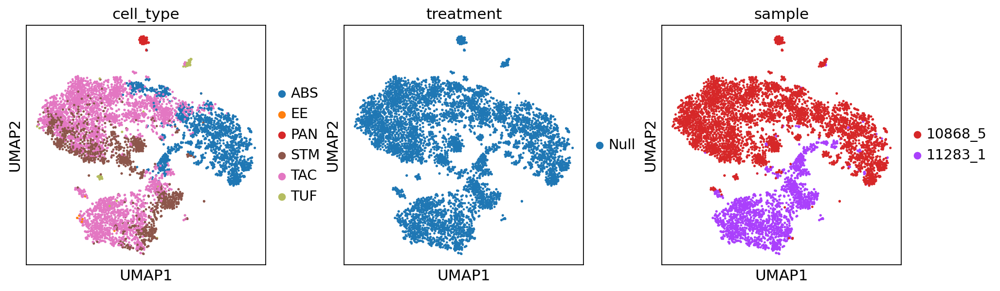

In [24]:
sc.pl.umap( mut, color = ['cell_type', 'treatment', 'sample'] )

## get final figures

In [61]:
wt_umap = pd.read_csv("./batch_effect_correction/wt_hm_umap.csv", header = None, index_col = None )
#wt_umap.head()
wt_umap.shape

(6427, 2)

In [62]:
wt_pca = pd.read_csv("./batch_effect_correction/wt_hm_pca.csv", header = None, index_col = None )

In [102]:
mut_umap = pd.read_csv("./batch_effect_correction/mut_hm_umap.csv", header = None, index_col = None )
#wt_umap.head()
mut_umap.shape

(6427, 2)

In [113]:
wt.n_obs

6427

In [114]:
mut.n_obs

6427

In [116]:
wt.obsm['X_umap']  = wt_umap.values

In [117]:
mut.obsm['X_umap']  = mut_umap.values

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


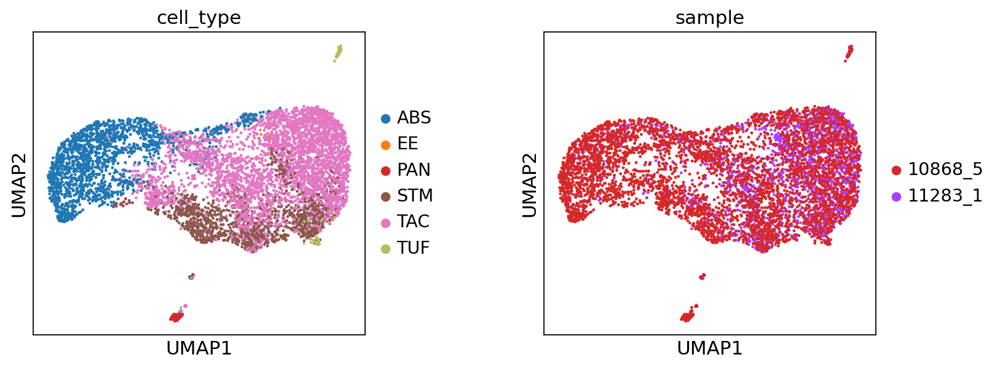

In [138]:
sc.pl.umap( mut, color = ['cell_type',  'sample'] , wspace = 0.4)

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


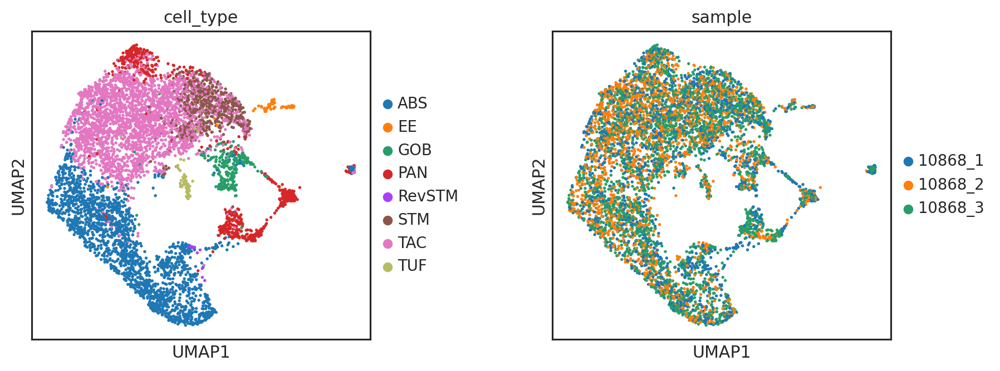

In [79]:
sc.pl.umap( wt, color = ['cell_type', 'sample'] , wspace = 0.4)

In [63]:
wt.X.sum(axis = 1)

array([ 881.1771  ,  -10.467865,  107.11574 , ...,    5.502548,
       -686.6729  ,  415.3698  ], dtype=float32)

In [131]:
mut.X.sum( axis = 1)

matrix([[145237.],
        [ 93151.],
        [ 90698.],
        ...,
        [   887.],
        [   882.],
        [   880.]], dtype=float32)

In [140]:
wt

AnnData object with n_obs × n_vars = 6427 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

### adjust wt umap 

In [64]:
wt.obsm['X_pca_harmony'] = wt_pca.values

In [88]:
n_neighbors = int( np.sqrt( mut.n_obs) )
sc.pp.neighbors( wt, n_neighbors= n_neighbors , n_pcs=50, use_rep='X_pca_harmony')


In [98]:
sc.tl.umap(wt,random_state= 2, min_dist = 1.2, spread = 2 )

In [94]:
sc.tl.leiden( wt, resolution=1.5)

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


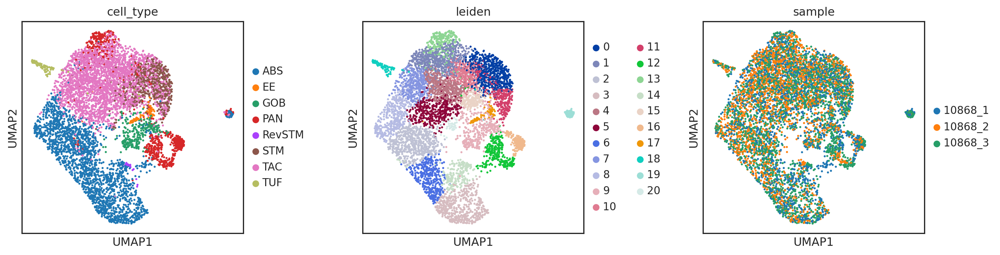

In [101]:
sc.pl.umap( wt, color = ['cell_type', 'leiden', 'sample' ], wspace = 0.4 )

In [148]:
#sc.pl.umap( wt, color = ['cell_type', 'sample' ], wspace = 0.4 )

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


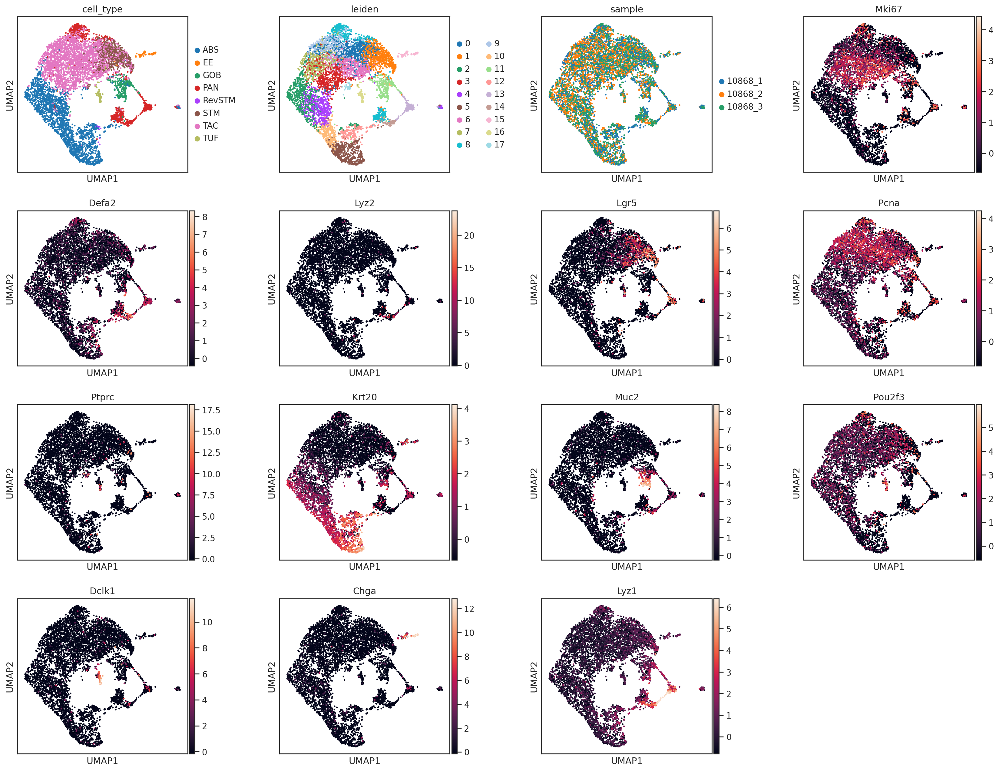

In [81]:
sc.pl.umap( wt, color = ['cell_type', 'leiden', 'sample', 'Mki67', 'Defa2', 'Lyz2'] + zc_filter.mouse_classic_markers , wspace = 0.4, use_raw = False)

still need to work on the annotation for paneth and TAC

In [102]:
wt2 = zc_filter.annotate_clusters( wt, from_label=['13'], new_label='TAC' )

In [104]:
wt2 = zc_filter.annotate_clusters( wt2, from_label=['12'], new_label='PAN' )

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


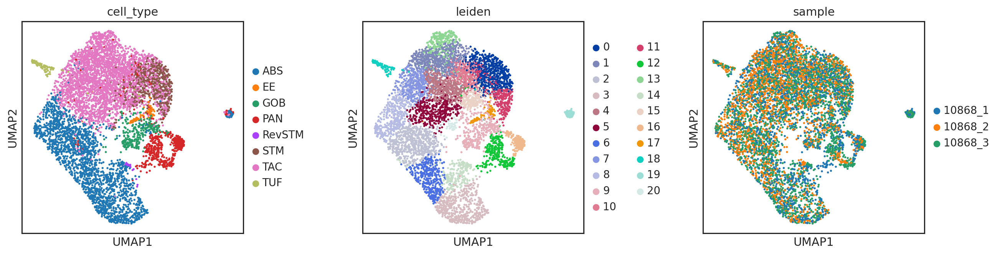

In [105]:
sc.pl.umap( wt2, color = ['cell_type', 'leiden', 'sample' ], wspace = 0.4 )

Subtype: T


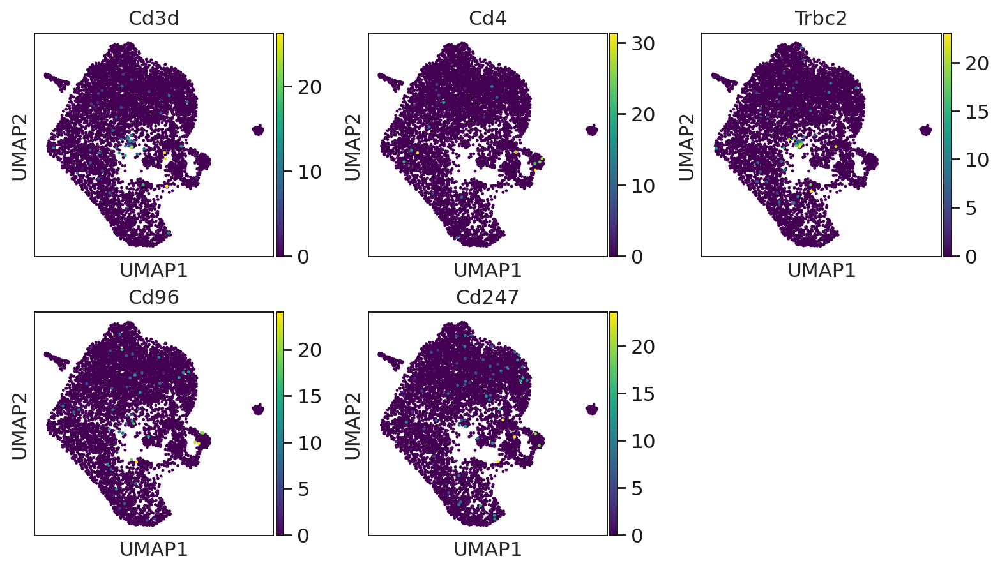

Subtype: MYE


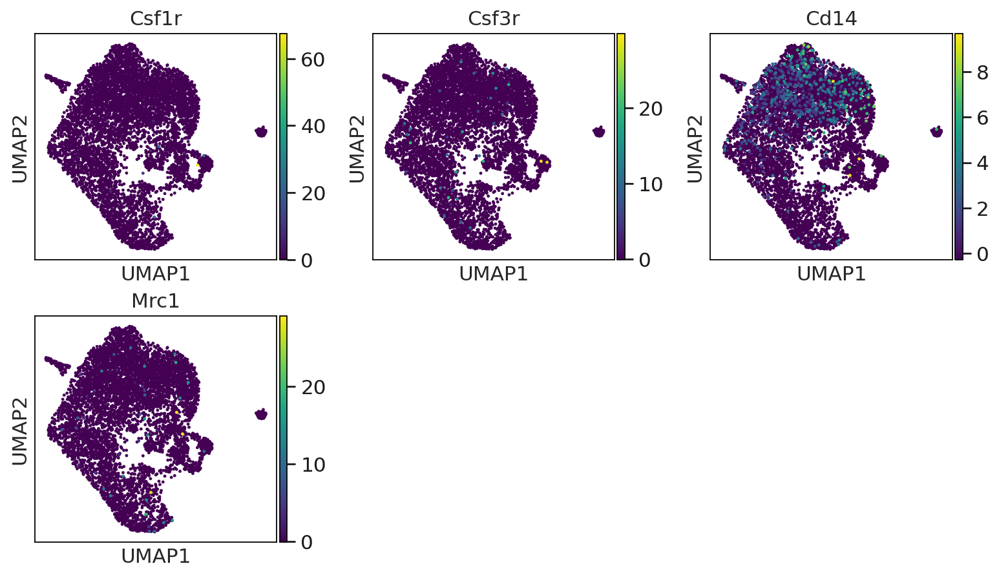

Subtype: MAS
error:'Could not find key Krt1 in .var_names or .obs.columns.'
Subtype: B
error:'Could not find key Cd19 in .var_names or .obs.columns.'
Subtype: PLAS
error:'Could not find key Igha1 in .var_names or .obs.columns.'
Subtype: END


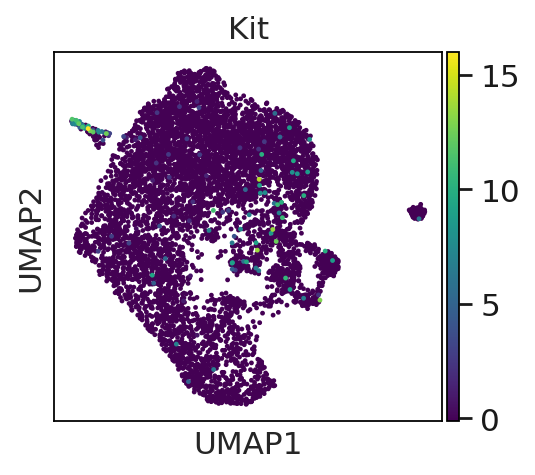

<Figure size 609.6x240 with 0 Axes>

<Figure size 914.4x240 with 0 Axes>

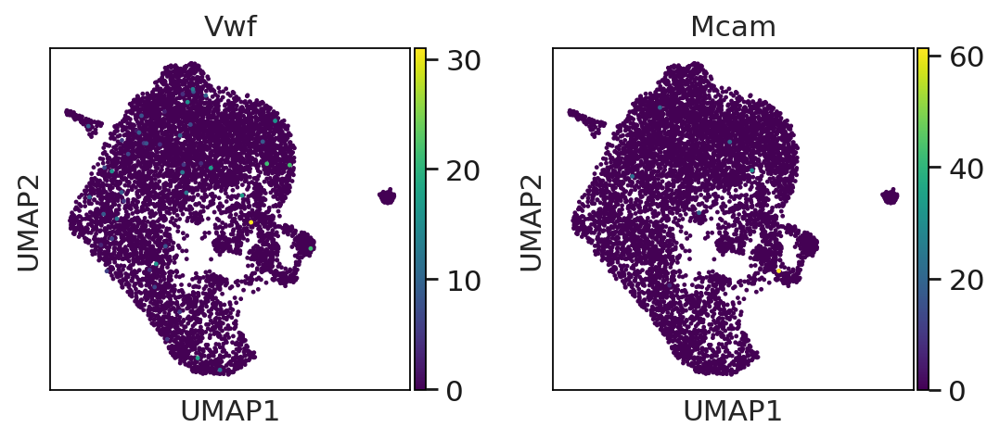

Subtype: FIB
error:'Could not find key Col1a1 in .var_names or .obs.columns.'


<Figure size 609.6x240 with 0 Axes>

In [106]:
zc_filter.markers_plots_dict( wt2, marker_dict=zc_filter.mouse_non_epi )

In [107]:
wt2.X.sum(axis = 1)

array([ 881.1771  ,  -10.467865,  107.11574 , ...,    5.502548,
       -686.6729  ,  415.3698  ], dtype=float32)

In [109]:
sc.tl.rank_genes_groups( wt2, groupby= 'leiden', use_raw = False, layer='arcsinh', method = 'wilcoxon', key_added='leiden_dge' )

/home/lucy/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/lucy/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/lucy/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:401: PerformanceWarning: DataFrame is highly fragmented.  This is 

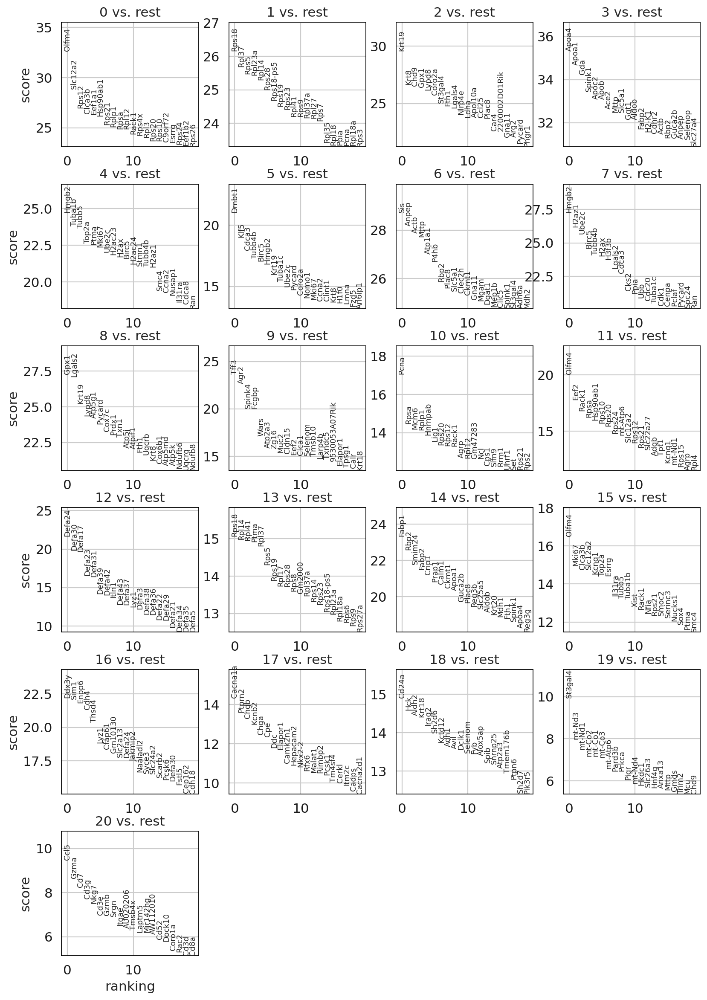

In [110]:
sc.pl.rank_genes_groups( wt2, key='leiden_dge' , sharey= False)

remove cluster 19

In [111]:
wt2 = zc_filter.annotate_clusters( wt2, from_label=['19'], new_label='ambient' )

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


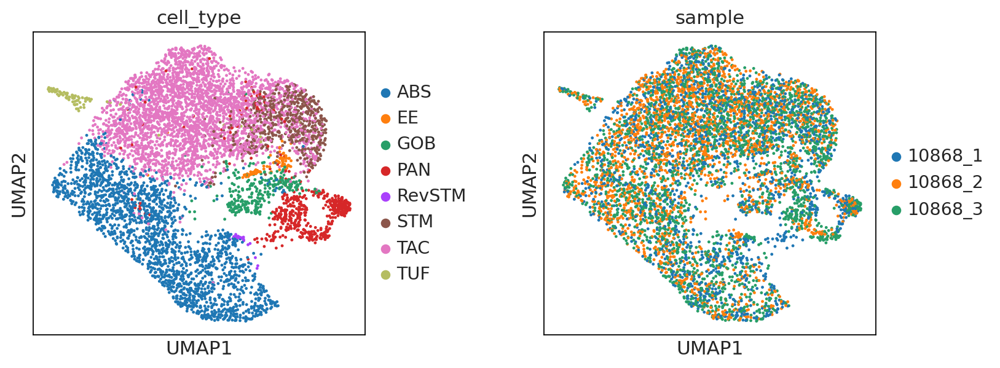

In [147]:
sc.pl.umap( wt2, color = ['cell_type', 'sample' ], wspace = 0.4 )

### update the combined dataset with new wt cell types

In [113]:
dat

AnnData object with n_obs × n_vars = 12854 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [115]:
dat.obs['cell_type_old'] = dat.obs['cell_type'].copy()

In [121]:
cell_type2 = []
for i in dat.obs.index:
    if( dat.obs.loc[i, 'treatment'] == 'WT'):
        cell_type2.append( wt2.obs.loc[i, 'cell_type'] )
    else:
        cell_type2.append( dat.obs.loc[i, 'cell_type'] )
        

In [122]:
dat.obs['cell_type'] = cell_type2

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


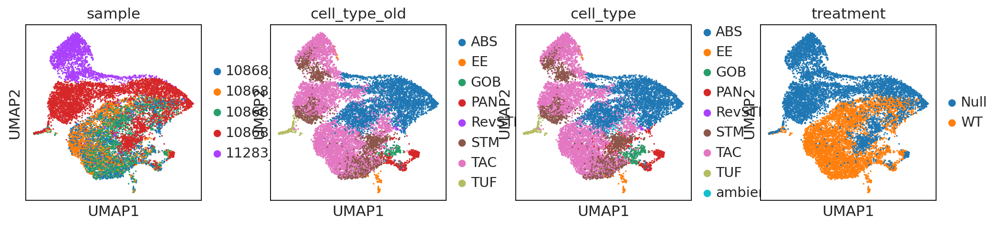

In [123]:
sc.pl.umap( dat, color = ['sample', 'cell_type_old', 'cell_type', 'treatment'] )

### remove the ambient cells from the wt and subsampled combined dataset
- remove cells
- save the h5ads
- save the pca and umap

In [130]:
wt2.X = wt2.raw.X

In [131]:
wt2.X.sum(axis = 1)

matrix([[5033.],
        [6964.],
        [4822.],
        ...,
        [3175.],
        [3316.],
        [9408.]], dtype=float32)

In [127]:
dat.X = dat.raw.X
dat.X.sum(axis = 1)

matrix([[5033.],
        [6964.],
        [4822.],
        ...,
        [ 887.],
        [ 882.],
        [ 880.]], dtype=float32)

In [133]:
wt2.n_obs #6427 cells before remove ambient

6427

In [134]:
wt2 = wt2[wt2.obs['cell_type'] != 'ambient'] 
wt2.shape #6365 cells

(6365, 21860)

In [136]:
wt2.raw = wt2.copy()

In [137]:
wt2

AnnData object with n_obs × n_vars = 6365 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition', 'cell_type_old'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap', 'cell_type_old_colors', 'leiden_dge'
    obsm: 'X_pca', 'X_umap', 'X_pca_harmony'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [138]:
dat.n_obs #12854 before remove ambient 
# should be 62 cells less than original number after removing

12854

In [139]:
dat = dat[dat.obs['cell_type'] != 'ambient'] 
dat.shape #12854 - 62

(12792, 21860)

## save data

In [25]:
wt_umap = pd.DataFrame( wt.obsm['X_umap'] )
wt_pca_har = pd.DataFrame( wt.obsm['X_pca_harmony'] )

In [26]:
mut_umap = pd.DataFrame( mut.obsm['X_umap'] )
mut_pca_har = pd.DataFrame( mut.obsm['X_pca_harmony'] )

In [27]:
save_ls = [wt_umap, wt_pca_har, mut_umap, mut_pca_har]
save_name = ['wt_hm_umap.csv', 'wt_hm_pca.csv', 'mut_hm_umap.csv', 'mut_hm_pca.csv']

In [29]:
for i in range(len( save_ls)):
    x = save_ls[i]
    x.to_csv("./batch_effect_correction/"+save_name[i], header = False, index = False )

save raw counts to let Ken make tsne

In [40]:
wt.X.sum(axis = 1)

matrix([[5033.],
        [6964.],
        [4822.],
        ...,
        [3175.],
        [3316.],
        [9408.]], dtype=float32)

In [41]:
mut.X.sum(axis = 1)

matrix([[145237.],
        [ 93151.],
        [ 90698.],
        ...,
        [   887.],
        [   882.],
        [   880.]], dtype=float32)

In [42]:
df = mut.to_df()

save the new mutant umap

In [128]:
pd.DataFrame( mut.obsm['X_umap'] ).to_csv("./batch_effect_correction/"+'mut_hm_umap2.csv', header = False, index = False )
# no saving for pca X because they are from the same X_pca
#pd.DataFrame( mut.obsm['X_pca'] ).to_csv("./batch_effect_correction/"+ 'mut_hm_pca2.csv', header = False, index = False )

In [145]:
pd.DataFrame( wt.obsm['X_umap'] ).to_csv("./batch_effect_correction/"+'wt_hm_umap2.csv', header = False, index = False )

In [43]:
def save_dat_csv(dat_df, name_prefix, folder = './'):
    dat_df.to_csv(folder+ name_prefix + "_mtx.csv", header = False, index = False)
    pd.Series(dat_df.index).to_csv( folder+ name_prefix + "_barcode.csv", header = False, index = False )
    pd.Series(dat_df.columns).to_csv( folder+ name_prefix + "_features.csv", header = False, index = False )

In [44]:
save_dat_csv( mut.to_df(), name_prefix='MUT', folder='./sample_csv2/' )

In [45]:
save_dat_csv( wt.to_df(), name_prefix='WT', folder='./sample_csv2/' )

save the h5ads

In [146]:
wt

AnnData object with n_obs × n_vars = 6427 × 21860
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'leiden', 'cell_type', 'treatment', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'X_pca_harmony'
    varm: 'PCs'
    layers: 'arcsinh', 'full_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [147]:
wt.X = wt.layers['raw_counts' ] 

In [149]:
wt.write( "./new_sample_10868_filtered/subsampled_wt_epi.h5ad", compression = 'gzip' )

In [148]:
mut.write( "./new_sample_10868_filtered/subsampled_mut_epi.h5ad", compression = 'gzip' )

### save new files after re-filter and re-annotation

save new cell type annotation

In [149]:
wt2.obs['cell_type'].to_csv("./revised_wt_cell_type_annotation.csv", header =True, index= True)

In [151]:
wt2.X.sum(axis = 1)

matrix([[5033.],
        [6964.],
        [4822.],
        ...,
        [4740.],
        [3316.],
        [9408.]], dtype=float32)

In [152]:
# the previous ones are moved to the old_subsampled folder
wt2.write( "./new_sample_10868_filtered/subsampled_wt_epi.h5ad", compression = 'gzip' )

In [141]:
dat.write( "new_sample_10868_filtered/subsampled_epi_12356.h5ad", compression = 'gzip' )

In [154]:
pd.DataFrame( wt2.obsm['X_umap'], index = wt2.obs.index ).to_csv("./batch_effect_correction/"+'wt_hm_umap_refilter.csv', header = False, index = True )

In [155]:
pd.DataFrame( wt2.obsm['X_pca'], index = wt2.obs.index ).to_csv("./batch_effect_correction/"+'wt_hm_pca_refilter.csv', header = False, index = True )